In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
from PIL import Image # 이미지 전처리
import os
import matplotlib.pyplot as plt # 이미지 미리보기 하기 위해


filelist = os.listdir('./img_align_celeba/img_align_celeba')

imgs = []

##### 이미지 전처리

for i in filelist[0:50000]:
    img = Image.open('./img_align_celeba/img_align_celeba/'+i).crop( (20,30,160,200) ).convert('L').resize( (64,64) ) # resize랑 convert 안하면 메모리초과남,,
    imgs.append( np.array(img) ) # 이미지의 여백(얼굴 자체를 제외한 부분)을 지우기 위해 크롭. 좌측 상단을 0,0으로 잡고 아래로 갈수록 증가하는 '-y'축을 사용한다
    # 0~1사이로 압축(나누기) 하기 위해 np array로 바꾸기. np쓰면 행렬 전체 나누기 가능 .resize( (64,64) ) 하면 resize됨, .convert(L) 하면 흑백됨(시간절약)

# plt.imshow(imgs[40])
# plt.show 주피터 노트북에서 봐야함

imgs = np.divide(imgs, 255) # 0~1 사이로 압축(시간절약)(나누기)
imgs = imgs.reshape( 50000, 64, 64, 1 ) # tf모델에는 4차원 행렬이 필요해서 마지막 1추가하기 위해 reshape
print('shape : ',imgs.shape)



##### 모델 만들기. discriminator는 이미지를 사람인지 아닌지 판별해주는 모델
# genetator는 숫자 100개 넣으면 사람같은이미지 뱉어주는 모델
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=[64,64,1]),
    # stride는 필터를 적용하는 간격을 말한다. 이미지처리는 그냥 relu쓴다고만 알자
    # 근데 LeakyReLU는 음수값을 0.01 곱해서 0이 아닌 작은 값으로만 해줌 이거쓰는게 결과 잘 나온대
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(64, (3,3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

noise_shape = 100

generator = tf.keras.models.Sequential([
  tf.keras.layers.Dense(4 * 4 * 256, input_shape=(100,) ), 
  tf.keras.layers.Reshape((4, 4, 256)),
  # Conv2DTranspose 쓰면 이미지가 점점 커짐. conv류는 이미지를 입력해줘야됨
  tf.keras.layers.Conv2DTranspose(256, 3, strides=2, padding='same'),
  tf.keras.layers.LeakyReLU(alpha=0.2),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same'),
  tf.keras.layers.LeakyReLU(alpha=0.2),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same'),
  tf.keras.layers.LeakyReLU(alpha=0.2),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2DTranspose(1, 3, strides=2, padding='same', activation='sigmoid')
])


GAN = tf.keras.models.Sequential([ generator, discriminator ])

discriminator.compile( optimizer='adam', loss='binary_crossentropy')

discriminator.trainable = False # generator 트레이닝 시킬 때 discriminator는 학습하면 안됨
GAN.compile( optimizer='adam', loss='binary_crossentropy')





shape :  (50000, 64, 64, 1)


2023-04-18 11:43:34.608178: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-18 11:43:35.386022: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-18 11:43:35.386701: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-18 11:43:35.408982: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

epoch 0/300 processing ...


2023-04-18 13:00:23.288245: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8204
2023-04-18 13:00:33.855623: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


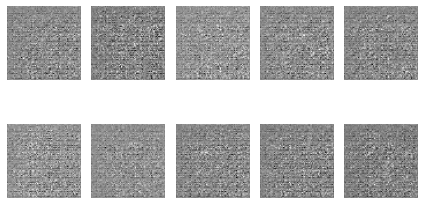

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 0 loss -> Discriminator : 0.8996054232120514, GAN : 0.7912604212760925
epoch 1/300 processing ...


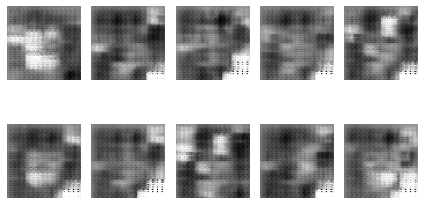

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 1 loss -> Discriminator : 1.236092746257782, GAN : 1.1150954961776733
epoch 2/300 processing ...


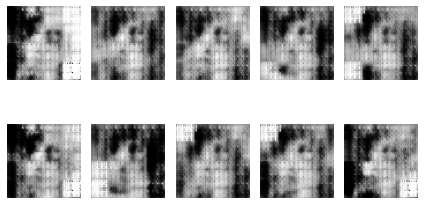

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 2 loss -> Discriminator : 0.9887401461601257, GAN : 0.6915755271911621
epoch 3/300 processing ...


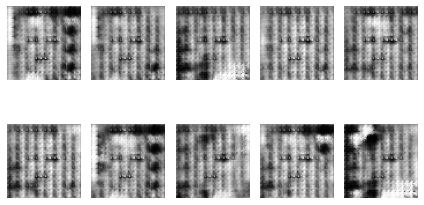

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 3 loss -> Discriminator : 1.1295395493507385, GAN : 0.8878399133682251
epoch 4/300 processing ...


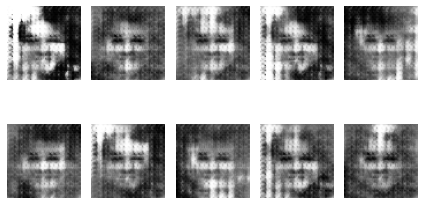

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 4 loss -> Discriminator : 0.8164868056774139, GAN : 1.1937742233276367
epoch 5/300 processing ...


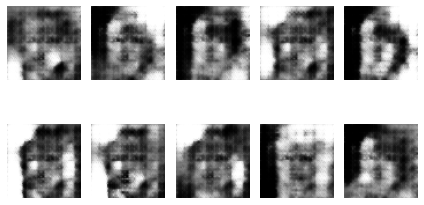

batch 0 processing...


2023-04-18 13:04:38.062808: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 13:04:45.267891: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 13:05:17.369777: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 5 loss -> Discriminator : 1.0923862755298615, GAN : 0.9292503595352173
epoch 6/300 processing ...


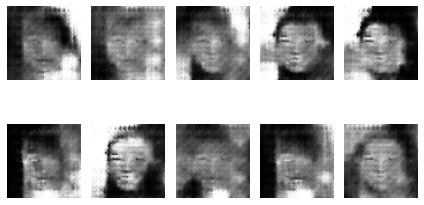

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 6 loss -> Discriminator : 0.7900920808315277, GAN : 1.5998672246932983
epoch 7/300 processing ...


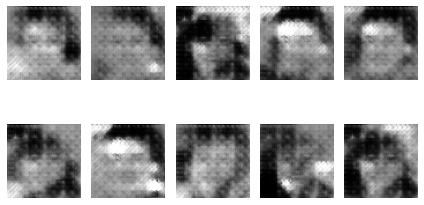

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 7 loss -> Discriminator : 1.219529926776886, GAN : 1.1017909049987793
epoch 8/300 processing ...


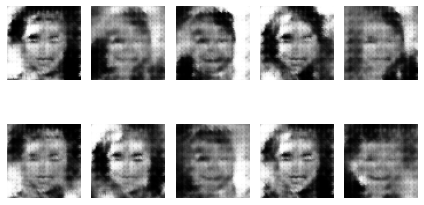

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 8 loss -> Discriminator : 1.206007719039917, GAN : 0.9933228492736816
epoch 9/300 processing ...


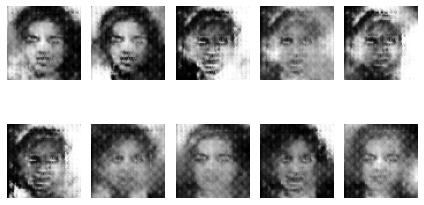

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 9 loss -> Discriminator : 1.2166202068328857, GAN : 1.2731589078903198
epoch 10/300 processing ...


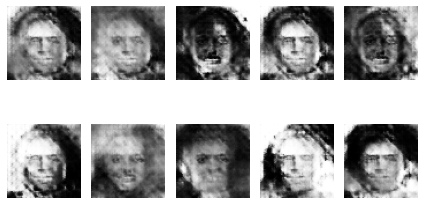

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 10 loss -> Discriminator : 1.1059117317199707, GAN : 1.0674104690551758
epoch 11/300 processing ...


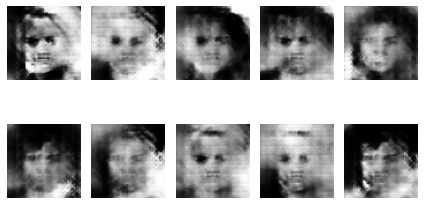

batch 0 processing...
batch 100 processing...


2023-04-18 13:09:39.692489: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 11 loss -> Discriminator : 1.0716398358345032, GAN : 1.3190640211105347
epoch 12/300 processing ...


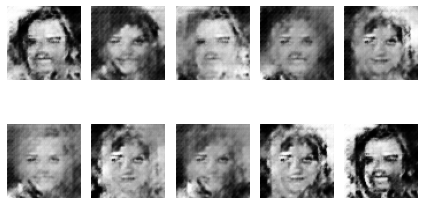

batch 0 processing...
batch 100 processing...


2023-04-18 13:10:27.901627: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 13:10:29.995063: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...


2023-04-18 13:10:37.886066: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 13:10:40.043682: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 12 loss -> Discriminator : 1.3473263382911682, GAN : 1.0345218181610107
epoch 13/300 processing ...


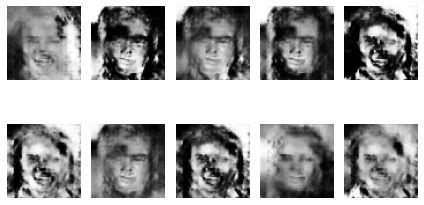

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 13 loss -> Discriminator : 1.2260612845420837, GAN : 1.0601252317428589
epoch 14/300 processing ...


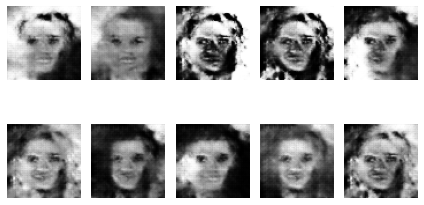

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 14 loss -> Discriminator : 1.2016271948814392, GAN : 1.2367031574249268
epoch 15/300 processing ...


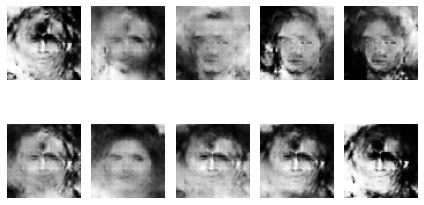

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 15 loss -> Discriminator : 1.1329073905944824, GAN : 1.3758325576782227
epoch 16/300 processing ...


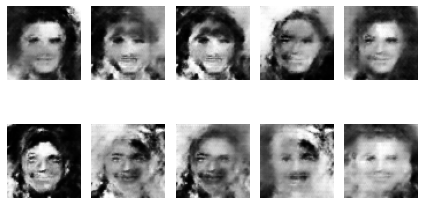

batch 0 processing...


2023-04-18 13:13:23.909662: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 16 loss -> Discriminator : 1.2731142044067383, GAN : 1.0479416847229004
epoch 17/300 processing ...


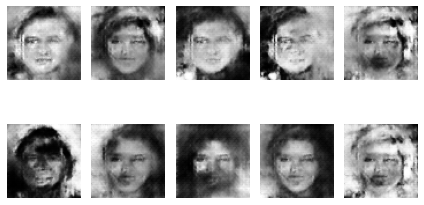

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 17 loss -> Discriminator : 1.0327678322792053, GAN : 1.6908198595046997
epoch 18/300 processing ...


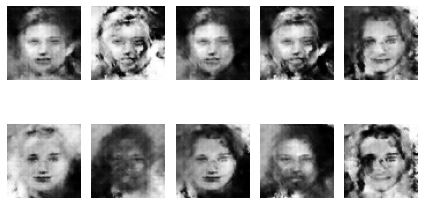

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 18 loss -> Discriminator : 1.2633074522018433, GAN : 1.2572417259216309
epoch 19/300 processing ...


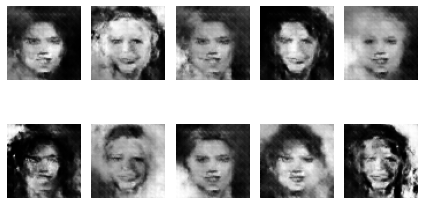

batch 0 processing...
batch 100 processing...


2023-04-18 13:15:56.370868: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 19 loss -> Discriminator : 1.0242750644683838, GAN : 1.4272825717926025
epoch 20/300 processing ...


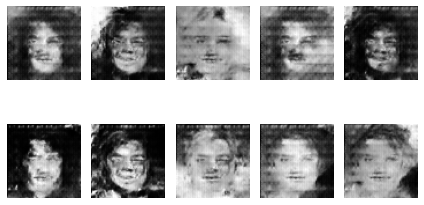

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 20 loss -> Discriminator : 0.9233830571174622, GAN : 1.661942481994629
epoch 21/300 processing ...


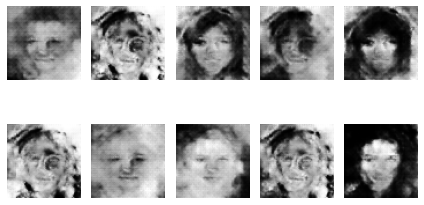

batch 0 processing...
batch 100 processing...


2023-04-18 13:17:28.779925: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 21 loss -> Discriminator : 1.0590155124664307, GAN : 1.5128121376037598
epoch 22/300 processing ...


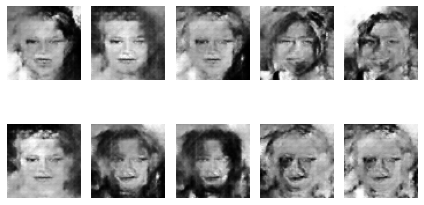

batch 0 processing...
batch 100 processing...


2023-04-18 13:18:18.274616: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 22 loss -> Discriminator : 0.9943266212940216, GAN : 1.3518998622894287
epoch 23/300 processing ...


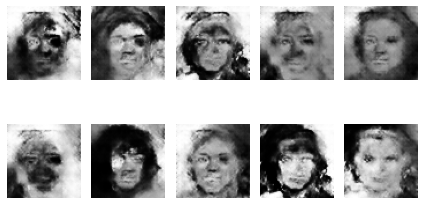

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 13:19:27.667857: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 23 loss -> Discriminator : 1.0191735625267029, GAN : 1.5388991832733154
epoch 24/300 processing ...


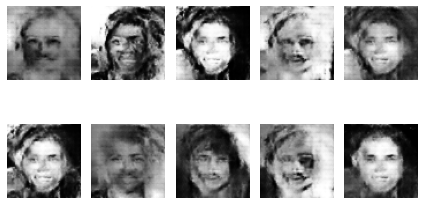

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 24 loss -> Discriminator : 1.2113649249076843, GAN : 1.3122645616531372
epoch 25/300 processing ...


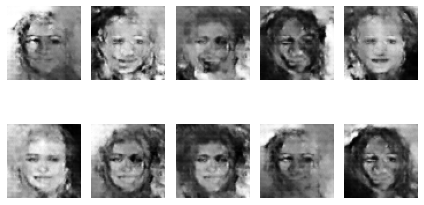

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 13:21:13.336844: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 25 loss -> Discriminator : 1.3019484281539917, GAN : 1.774511456489563
epoch 26/300 processing ...


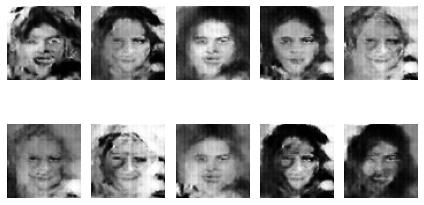

batch 0 processing...


2023-04-18 13:21:23.433705: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 26 loss -> Discriminator : 0.79246586561203, GAN : 2.1333587169647217
epoch 27/300 processing ...


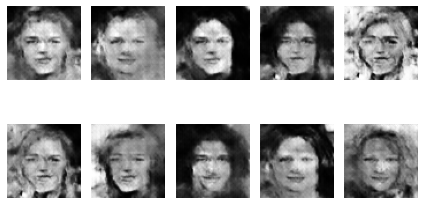

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 27 loss -> Discriminator : 0.905132919549942, GAN : 1.8832213878631592
epoch 28/300 processing ...


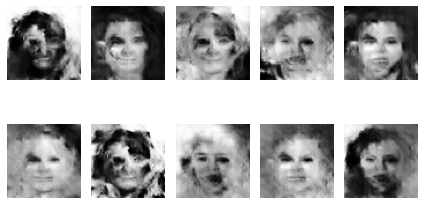

batch 0 processing...


2023-04-18 13:22:53.995619: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 13:22:54.141259: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 28 loss -> Discriminator : 0.8724592626094818, GAN : 2.0150976181030273
epoch 29/300 processing ...


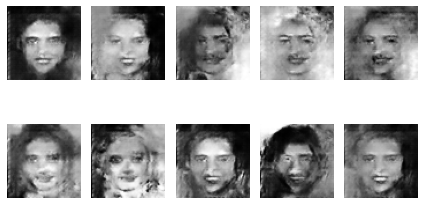

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 13:24:15.152205: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 29 loss -> Discriminator : 0.7512434124946594, GAN : 1.9452379941940308
epoch 30/300 processing ...


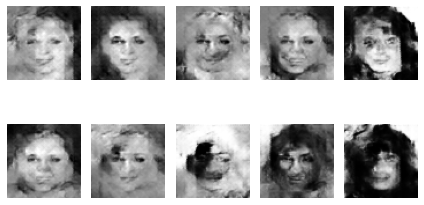

batch 0 processing...


2023-04-18 13:24:32.513037: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 13:25:10.210716: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 30 loss -> Discriminator : 0.8146849870681763, GAN : 2.1183838844299316
epoch 31/300 processing ...


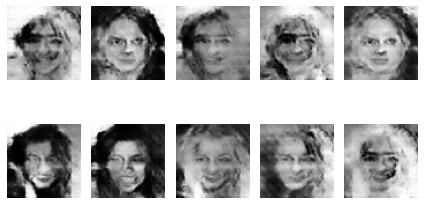

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 31 loss -> Discriminator : 0.7920162677764893, GAN : 2.5395736694335938
epoch 32/300 processing ...


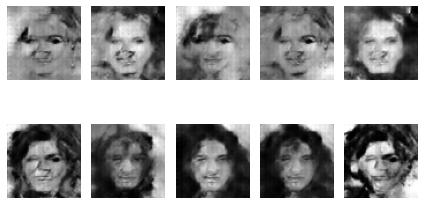

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 13:26:30.815071: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 32 loss -> Discriminator : 1.2969313263893127, GAN : 2.3360843658447266
epoch 33/300 processing ...


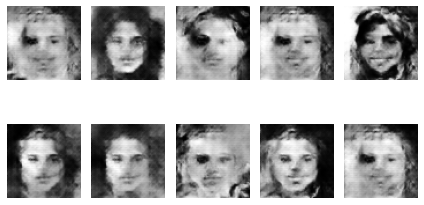

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 33 loss -> Discriminator : 0.7050948143005371, GAN : 2.1815664768218994
epoch 34/300 processing ...


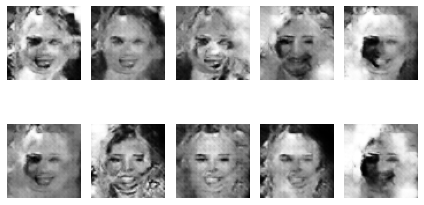

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 13:28:18.947017: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 13:28:19.773932: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 34 loss -> Discriminator : 0.7812287509441376, GAN : 2.3219985961914062
epoch 35/300 processing ...


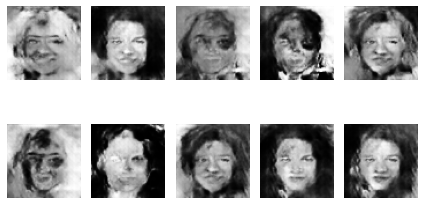

batch 0 processing...
batch 100 processing...


2023-04-18 13:28:45.677720: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 35 loss -> Discriminator : 0.5636016130447388, GAN : 2.7641186714172363
epoch 36/300 processing ...


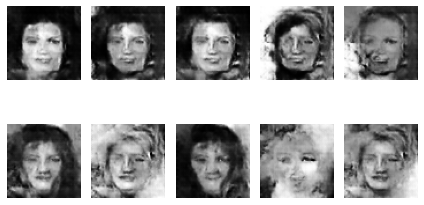

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 13:29:46.095956: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 36 loss -> Discriminator : 0.8746437728404999, GAN : 2.122218370437622
epoch 37/300 processing ...


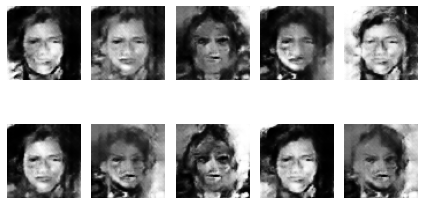

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 13:30:43.017500: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 37 loss -> Discriminator : 0.6629691421985626, GAN : 2.5922770500183105
epoch 38/300 processing ...


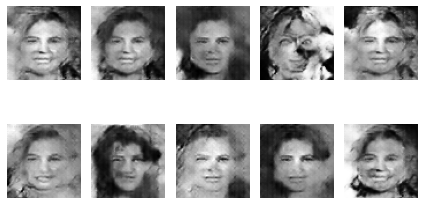

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 13:31:32.392976: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 38 loss -> Discriminator : 0.5795623064041138, GAN : 2.4707326889038086
epoch 39/300 processing ...


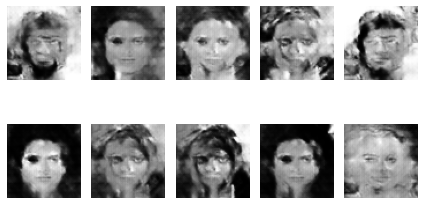

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 39 loss -> Discriminator : 0.8088248074054718, GAN : 1.985130786895752
epoch 40/300 processing ...


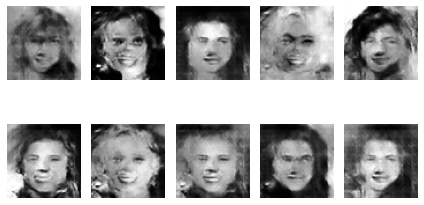

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 40 loss -> Discriminator : 0.8269977271556854, GAN : 2.274970531463623
epoch 41/300 processing ...


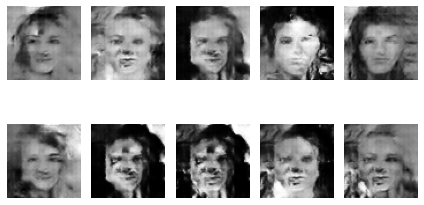

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 13:34:01.820289: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 41 loss -> Discriminator : 0.6407547891139984, GAN : 3.145442485809326
epoch 42/300 processing ...


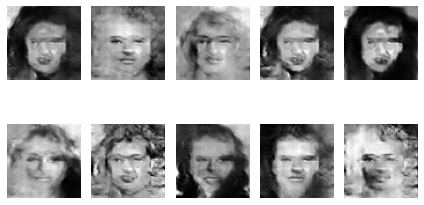

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 42 loss -> Discriminator : 0.7443542182445526, GAN : 2.5120351314544678
epoch 43/300 processing ...


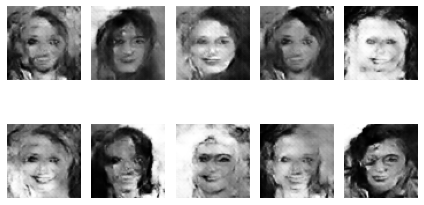

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 43 loss -> Discriminator : 1.1782555878162384, GAN : 2.135495901107788
epoch 44/300 processing ...


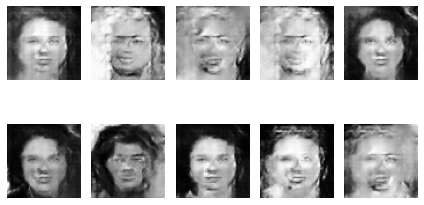

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 44 loss -> Discriminator : 0.69285848736763, GAN : 2.8567638397216797
epoch 45/300 processing ...


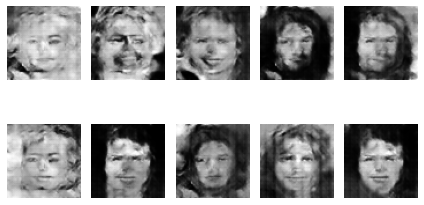

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 45 loss -> Discriminator : 0.7820493280887604, GAN : 2.9373061656951904
epoch 46/300 processing ...


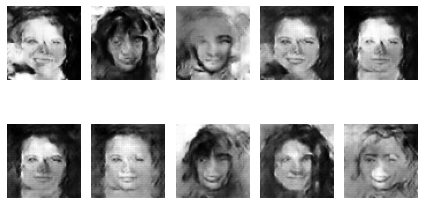

batch 0 processing...


2023-04-18 13:37:40.037352: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 46 loss -> Discriminator : 0.819256991147995, GAN : 2.730059862136841
epoch 47/300 processing ...


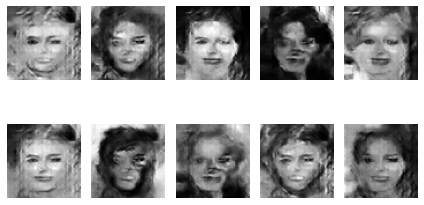

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 47 loss -> Discriminator : 0.6604076027870178, GAN : 3.1704461574554443
epoch 48/300 processing ...


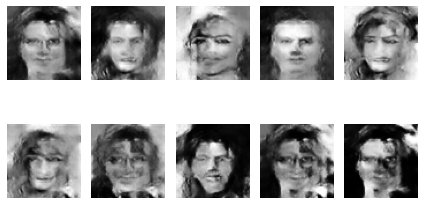

batch 0 processing...


2023-04-18 13:39:23.138947: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...


2023-04-18 13:39:45.410249: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 48 loss -> Discriminator : 0.7878865897655487, GAN : 2.699613094329834
epoch 49/300 processing ...


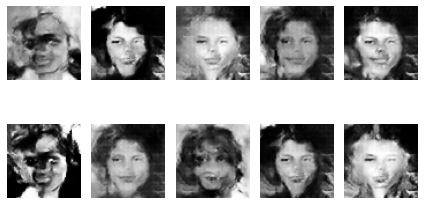

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 49 loss -> Discriminator : 1.1040061116218567, GAN : 3.339449405670166
epoch 50/300 processing ...


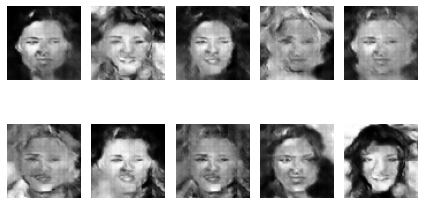

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 13:41:35.639899: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 50 loss -> Discriminator : 0.458642840385437, GAN : 3.9999256134033203
epoch 51/300 processing ...


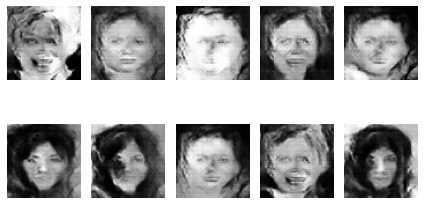

batch 0 processing...


2023-04-18 13:41:44.141756: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...


2023-04-18 13:41:56.534270: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 51 loss -> Discriminator : 0.5836971700191498, GAN : 3.1973283290863037
epoch 52/300 processing ...


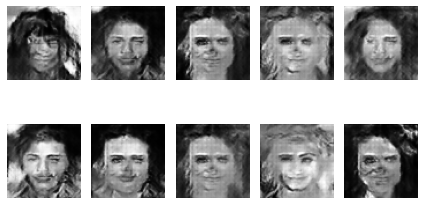

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 52 loss -> Discriminator : 0.6985149681568146, GAN : 2.9280874729156494
epoch 53/300 processing ...


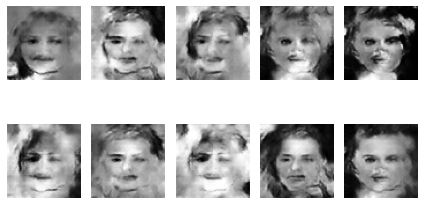

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 53 loss -> Discriminator : 0.6231565475463867, GAN : 3.887932062149048
epoch 54/300 processing ...


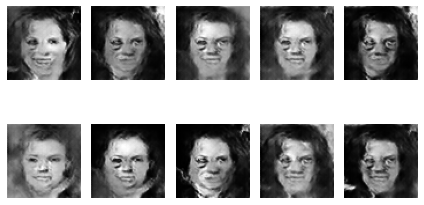

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 54 loss -> Discriminator : 0.8310584723949432, GAN : 2.8933563232421875
epoch 55/300 processing ...


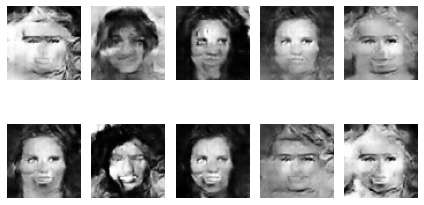

batch 0 processing...


2023-04-18 13:44:57.324479: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...


2023-04-18 13:45:20.157775: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 55 loss -> Discriminator : 0.6767020523548126, GAN : 2.6870875358581543
epoch 56/300 processing ...


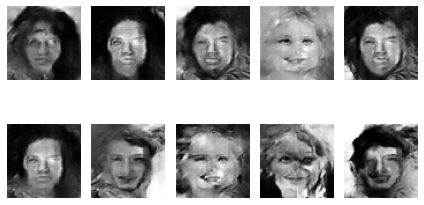

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 56 loss -> Discriminator : 0.7796797156333923, GAN : 3.3718340396881104
epoch 57/300 processing ...


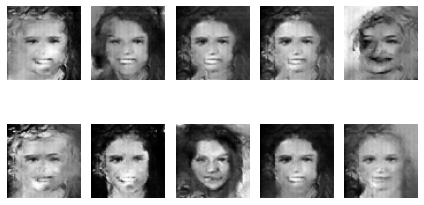

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 57 loss -> Discriminator : 1.1044431328773499, GAN : 4.645106792449951
epoch 58/300 processing ...


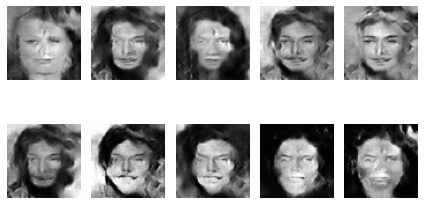

batch 0 processing...


2023-04-18 13:47:33.182624: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 13:48:09.027966: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 58 loss -> Discriminator : 0.8012312650680542, GAN : 2.571457624435425
epoch 59/300 processing ...


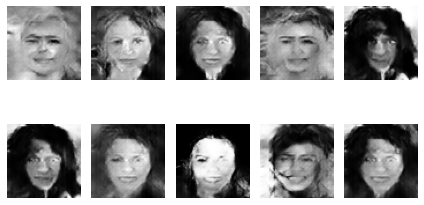

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 59 loss -> Discriminator : 0.858389675617218, GAN : 2.7713727951049805
epoch 60/300 processing ...


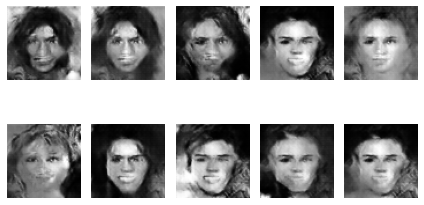

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 60 loss -> Discriminator : 0.8652569055557251, GAN : 2.382309913635254
epoch 61/300 processing ...


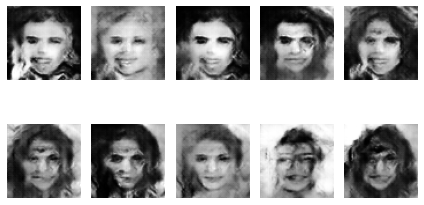

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 13:50:18.364440: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 61 loss -> Discriminator : 1.1118634939193726, GAN : 2.8550283908843994
epoch 62/300 processing ...


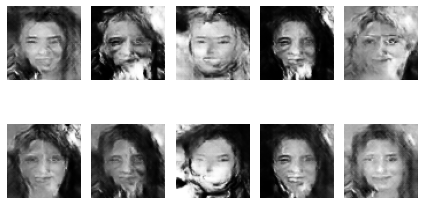

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 62 loss -> Discriminator : 0.8679961860179901, GAN : 2.756486654281616
epoch 63/300 processing ...


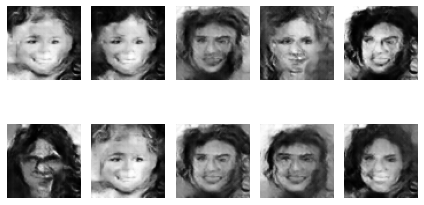

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 63 loss -> Discriminator : 0.7402381002902985, GAN : 2.7453982830047607
epoch 64/300 processing ...


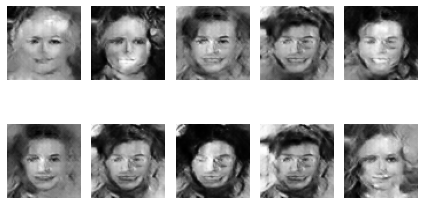

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 64 loss -> Discriminator : 0.595912292599678, GAN : 2.7307164669036865
epoch 65/300 processing ...


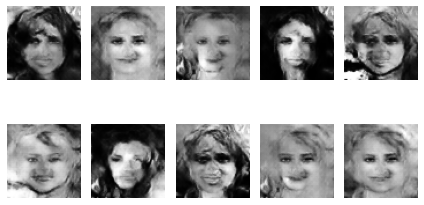

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 65 loss -> Discriminator : 0.9656825661659241, GAN : 3.1139321327209473
epoch 66/300 processing ...


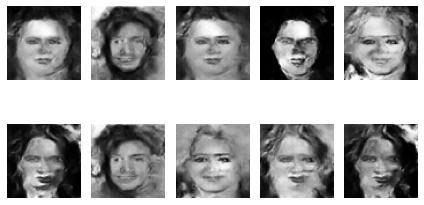

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 66 loss -> Discriminator : 0.7154564559459686, GAN : 3.14495849609375
epoch 67/300 processing ...


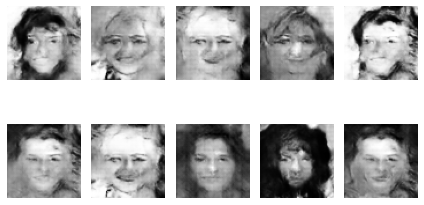

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 67 loss -> Discriminator : 0.730974555015564, GAN : 2.8664228916168213
epoch 68/300 processing ...


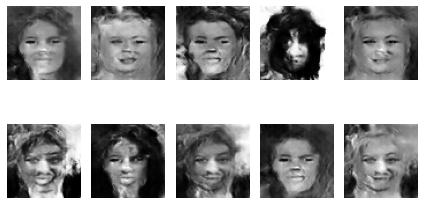

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 68 loss -> Discriminator : 0.6501651406288147, GAN : 3.194301128387451
epoch 69/300 processing ...


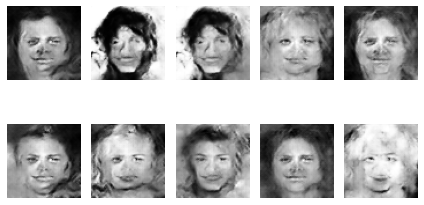

batch 0 processing...
batch 100 processing...


2023-04-18 13:56:41.647601: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 69 loss -> Discriminator : 0.6539021581411362, GAN : 3.815624237060547
epoch 70/300 processing ...


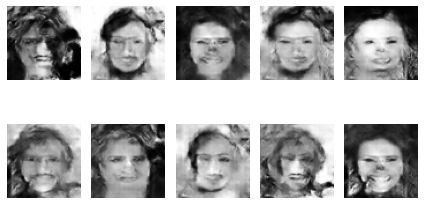

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 13:57:53.769955: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 70 loss -> Discriminator : 0.7703007757663727, GAN : 2.9031152725219727
epoch 71/300 processing ...


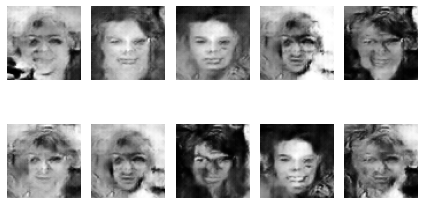

batch 0 processing...
batch 100 processing...


2023-04-18 13:58:28.654172: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 71 loss -> Discriminator : 0.6438159644603729, GAN : 2.70070743560791
epoch 72/300 processing ...


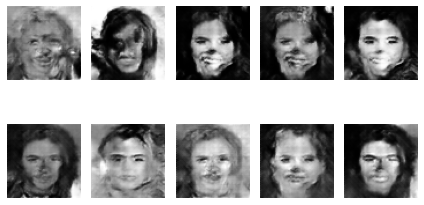

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 72 loss -> Discriminator : 0.5336381942033768, GAN : 3.340613603591919
epoch 73/300 processing ...


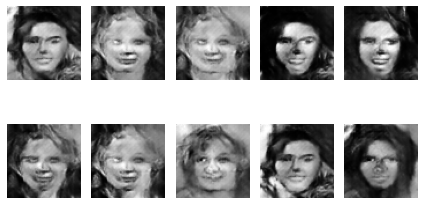

batch 0 processing...
batch 100 processing...


2023-04-18 14:00:10.291022: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 73 loss -> Discriminator : 0.525767058134079, GAN : 3.455305576324463
epoch 74/300 processing ...


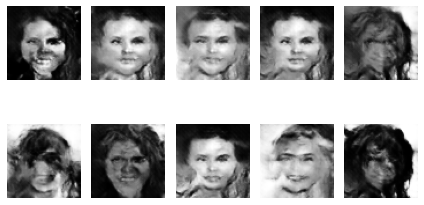

batch 0 processing...
batch 100 processing...


2023-04-18 14:00:54.670345: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 74 loss -> Discriminator : 1.1945882439613342, GAN : 2.5598232746124268
epoch 75/300 processing ...


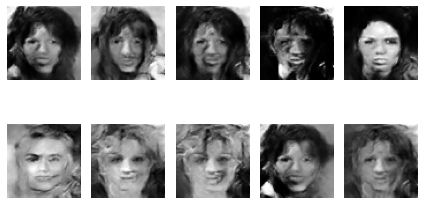

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 75 loss -> Discriminator : 0.8224594593048096, GAN : 3.1095752716064453
epoch 76/300 processing ...


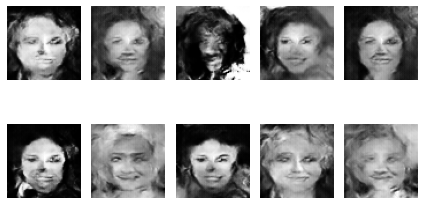

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 76 loss -> Discriminator : 0.4938246011734009, GAN : 4.282912254333496
epoch 77/300 processing ...


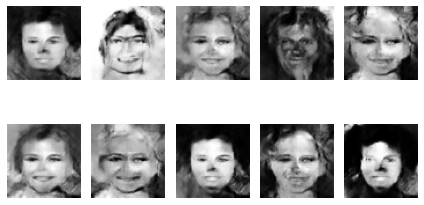

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:03:49.678235: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 77 loss -> Discriminator : 0.6011175066232681, GAN : 3.110440492630005
epoch 78/300 processing ...


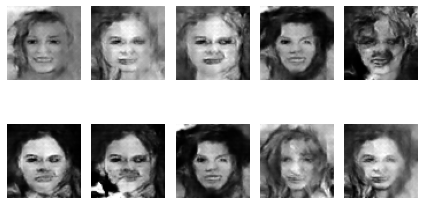

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 78 loss -> Discriminator : 0.8830499053001404, GAN : 3.1081905364990234
epoch 79/300 processing ...


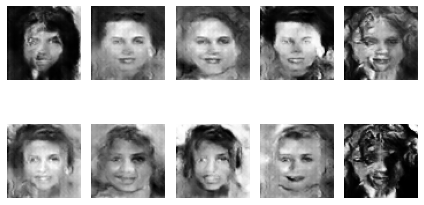

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 79 loss -> Discriminator : 0.6290924847126007, GAN : 2.860605239868164
epoch 80/300 processing ...


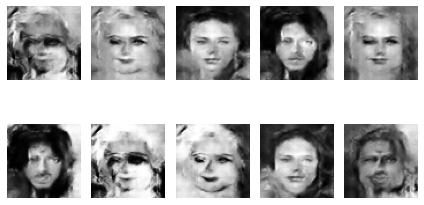

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 80 loss -> Discriminator : 0.5371054112911224, GAN : 3.5598745346069336
epoch 81/300 processing ...


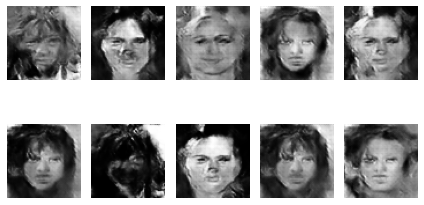

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:07:10.605920: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 81 loss -> Discriminator : 0.7455121278762817, GAN : 3.314265251159668
epoch 82/300 processing ...


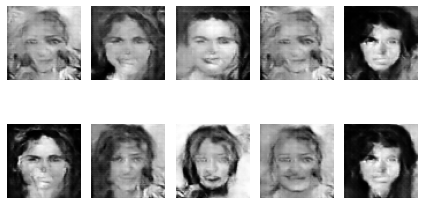

batch 0 processing...


2023-04-18 14:07:25.285821: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 82 loss -> Discriminator : 0.5905435085296631, GAN : 3.3527541160583496
epoch 83/300 processing ...


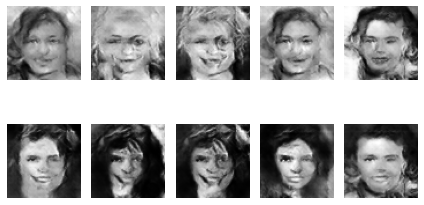

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 83 loss -> Discriminator : 0.8240462243556976, GAN : 2.425640106201172
epoch 84/300 processing ...


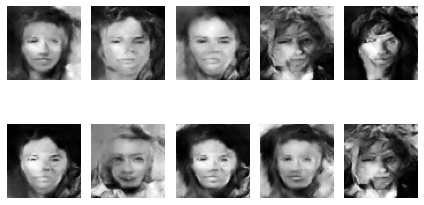

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 84 loss -> Discriminator : 1.016107827425003, GAN : 2.4627535343170166
epoch 85/300 processing ...


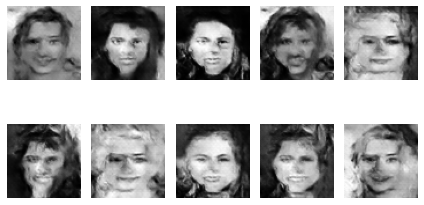

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 85 loss -> Discriminator : 0.7322646677494049, GAN : 2.7285332679748535
epoch 86/300 processing ...


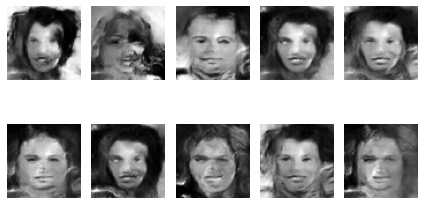

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 86 loss -> Discriminator : 0.5671994537115097, GAN : 2.927769184112549
epoch 87/300 processing ...


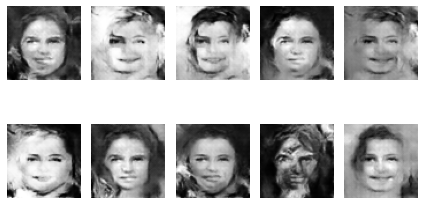

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 14:12:01.613421: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 87 loss -> Discriminator : 0.5609603524208069, GAN : 3.81793212890625
epoch 88/300 processing ...


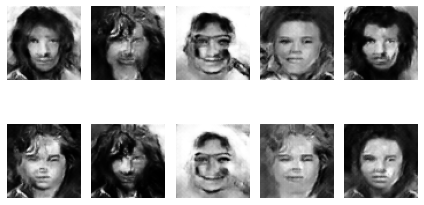

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 88 loss -> Discriminator : 0.8471307456493378, GAN : 3.6390373706817627
epoch 89/300 processing ...


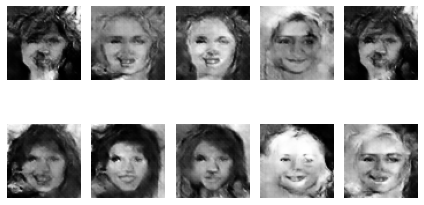

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 89 loss -> Discriminator : 0.694772869348526, GAN : 3.3182177543640137
epoch 90/300 processing ...


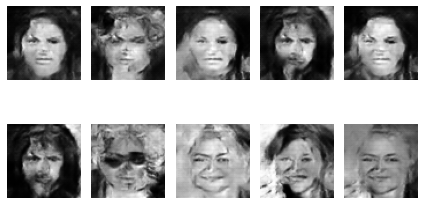

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:14:50.815328: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 90 loss -> Discriminator : 0.898979902267456, GAN : 2.8108975887298584
epoch 91/300 processing ...


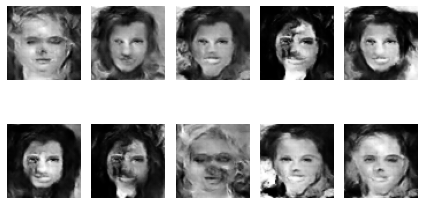

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 91 loss -> Discriminator : 0.6959190517663956, GAN : 3.0734829902648926
epoch 92/300 processing ...


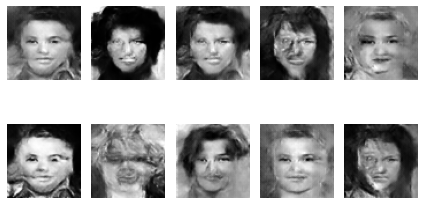

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 92 loss -> Discriminator : 0.42688407003879547, GAN : 3.9099462032318115
epoch 93/300 processing ...


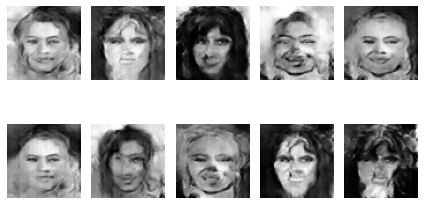

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 93 loss -> Discriminator : 0.7496249973773956, GAN : 3.3507914543151855
epoch 94/300 processing ...


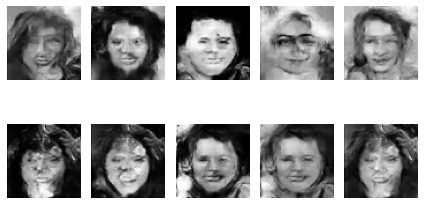

batch 0 processing...
batch 100 processing...


2023-04-18 14:17:39.676482: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 94 loss -> Discriminator : 0.8358824551105499, GAN : 2.901087760925293
epoch 95/300 processing ...


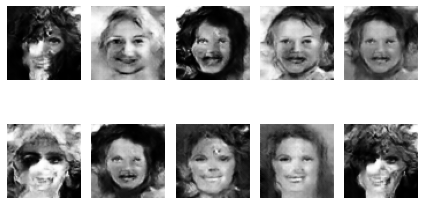

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 95 loss -> Discriminator : 0.835918664932251, GAN : 2.7272472381591797
epoch 96/300 processing ...


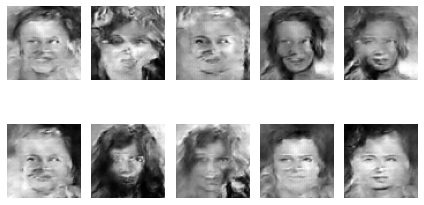

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 96 loss -> Discriminator : 0.7627858221530914, GAN : 2.888615608215332
epoch 97/300 processing ...


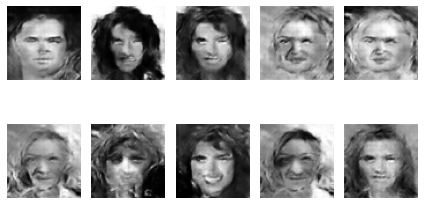

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 97 loss -> Discriminator : 0.8326528668403625, GAN : 2.8861446380615234
epoch 98/300 processing ...


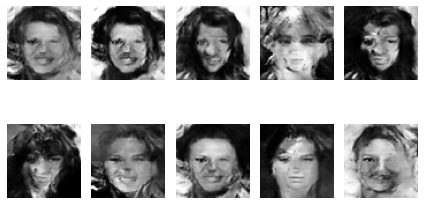

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 98 loss -> Discriminator : 1.0327479839324951, GAN : 2.4237327575683594
epoch 99/300 processing ...


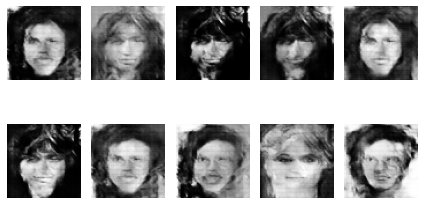

batch 0 processing...
batch 100 processing...


2023-04-18 14:21:54.173918: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 99 loss -> Discriminator : 0.5899088680744171, GAN : 3.5889902114868164
epoch 100/300 processing ...


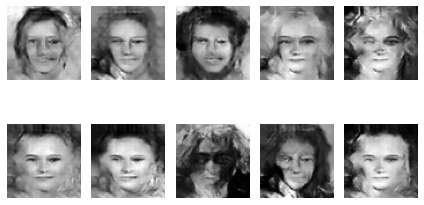

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 100 loss -> Discriminator : 1.0900293588638306, GAN : 2.37027645111084
epoch 101/300 processing ...


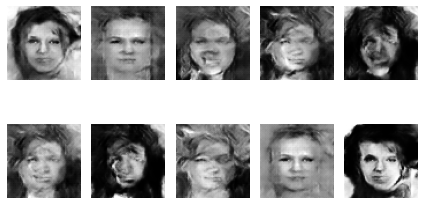

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 101 loss -> Discriminator : 0.8144623637199402, GAN : 2.991436243057251
epoch 102/300 processing ...


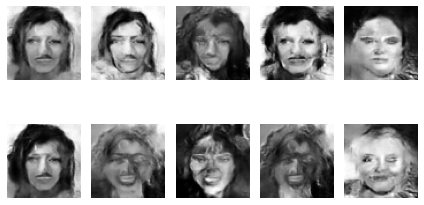

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 102 loss -> Discriminator : 0.700448215007782, GAN : 2.891458749771118
epoch 103/300 processing ...


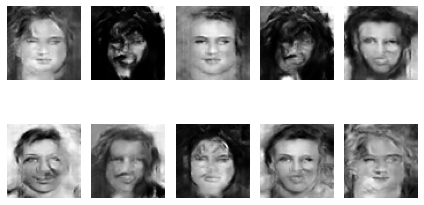

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 103 loss -> Discriminator : 1.0290785729885101, GAN : 2.048351287841797
epoch 104/300 processing ...


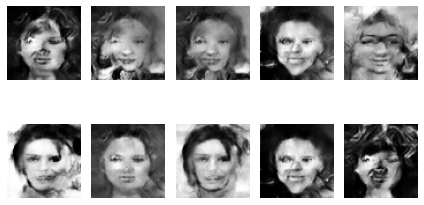

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 14:26:22.769024: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 104 loss -> Discriminator : 0.6367592811584473, GAN : 2.834989547729492
epoch 105/300 processing ...


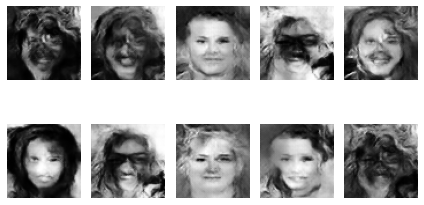

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 105 loss -> Discriminator : 0.6866294741630554, GAN : 3.018174409866333
epoch 106/300 processing ...


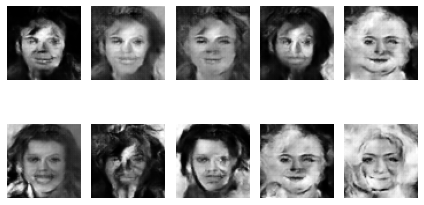

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 106 loss -> Discriminator : 0.6679874360561371, GAN : 3.5390987396240234
epoch 107/300 processing ...


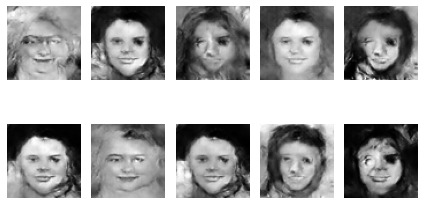

batch 0 processing...
batch 100 processing...


2023-04-18 14:28:43.776666: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 14:28:46.332478: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 107 loss -> Discriminator : 0.5987930595874786, GAN : 2.4961743354797363
epoch 108/300 processing ...


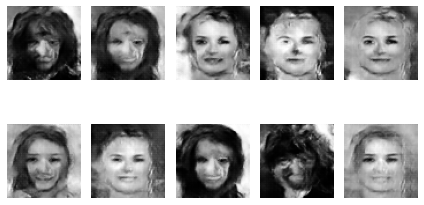

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:29:57.296461: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 14:30:00.514939: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 14:30:00.920156: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 14:30:12.365175: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 108 loss -> Discriminator : 1.0323653817176819, GAN : 2.5361709594726562
epoch 109/300 processing ...


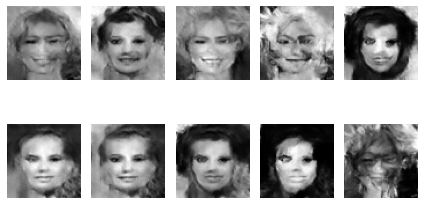

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:31:03.583960: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 109 loss -> Discriminator : 0.8596184849739075, GAN : 3.0344619750976562
epoch 110/300 processing ...


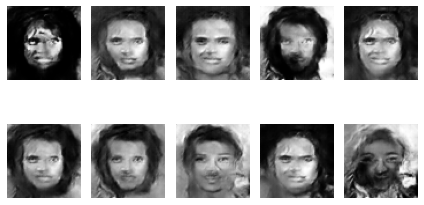

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:31:55.429793: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 110 loss -> Discriminator : 0.9672768712043762, GAN : 2.6432387828826904
epoch 111/300 processing ...


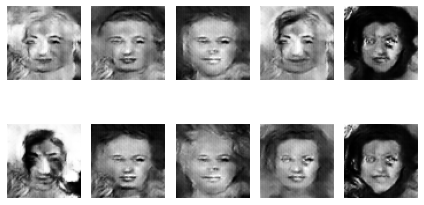

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 111 loss -> Discriminator : 0.7338339388370514, GAN : 2.8354129791259766
epoch 112/300 processing ...


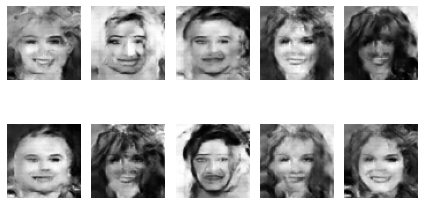

batch 0 processing...
batch 100 processing...


2023-04-18 14:33:07.044663: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...


2023-04-18 14:33:26.555732: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 112 loss -> Discriminator : 0.8817209601402283, GAN : 2.9313783645629883
epoch 113/300 processing ...


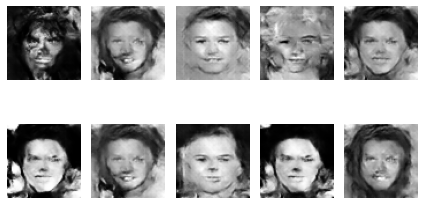

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 113 loss -> Discriminator : 0.7124855369329453, GAN : 3.3770956993103027
epoch 114/300 processing ...


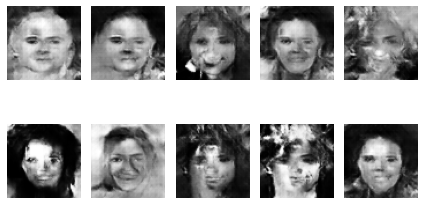

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 14:35:02.033460: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 114 loss -> Discriminator : 0.6775412559509277, GAN : 3.0784170627593994
epoch 115/300 processing ...


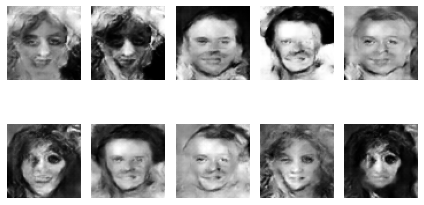

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 14:36:04.485955: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 115 loss -> Discriminator : 0.6745259165763855, GAN : 3.6591811180114746
epoch 116/300 processing ...


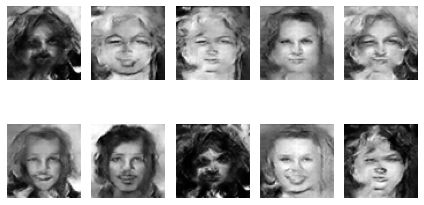

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 116 loss -> Discriminator : 0.5950904786586761, GAN : 3.051853656768799
epoch 117/300 processing ...


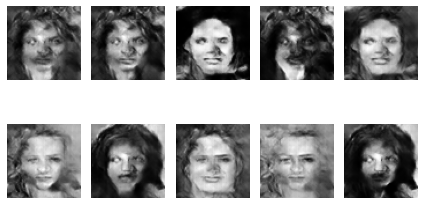

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 117 loss -> Discriminator : 0.6350017189979553, GAN : 3.6932966709136963
epoch 118/300 processing ...


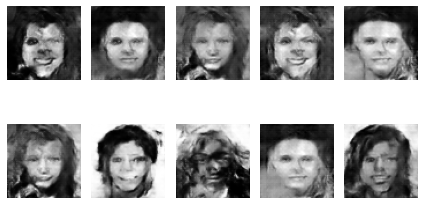

batch 0 processing...


2023-04-18 14:38:06.367484: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...


2023-04-18 14:38:19.933329: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 118 loss -> Discriminator : 0.6828921437263489, GAN : 2.71555233001709
epoch 119/300 processing ...


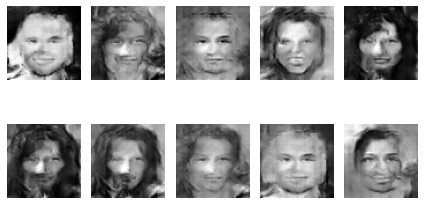

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 119 loss -> Discriminator : 0.47861842811107635, GAN : 4.163975715637207
epoch 120/300 processing ...


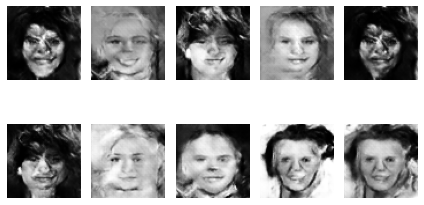

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 14:40:21.026394: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 120 loss -> Discriminator : 0.8698825240135193, GAN : 2.4137275218963623
epoch 121/300 processing ...


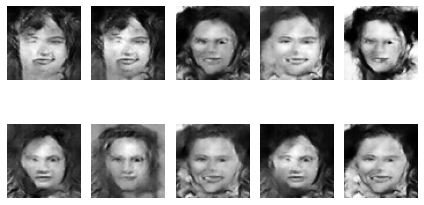

batch 0 processing...


2023-04-18 14:40:48.012640: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:41:17.706824: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 121 loss -> Discriminator : 0.7418894469738007, GAN : 2.518692970275879
epoch 122/300 processing ...


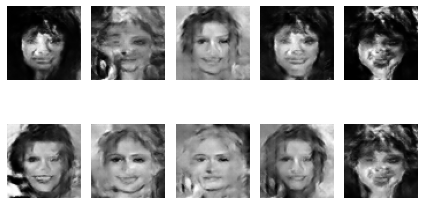

batch 0 processing...


2023-04-18 14:41:37.764073: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:42:18.060638: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 122 loss -> Discriminator : 0.6369273662567139, GAN : 3.4700770378112793
epoch 123/300 processing ...


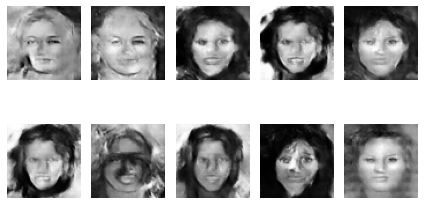

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 123 loss -> Discriminator : 0.5452087819576263, GAN : 3.3281912803649902
epoch 124/300 processing ...


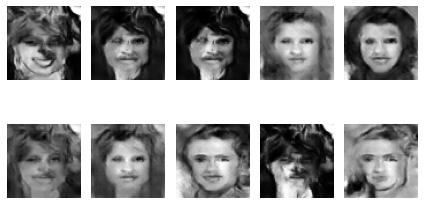

batch 0 processing...
batch 100 processing...


2023-04-18 14:43:32.369041: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 124 loss -> Discriminator : 0.7192384004592896, GAN : 2.4235122203826904
epoch 125/300 processing ...


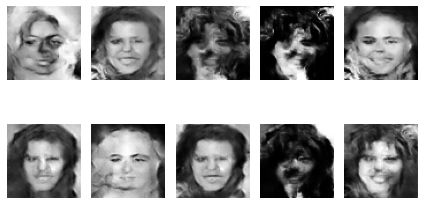

batch 0 processing...
batch 100 processing...


2023-04-18 14:44:19.017614: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 125 loss -> Discriminator : 0.823776125907898, GAN : 2.961770534515381
epoch 126/300 processing ...


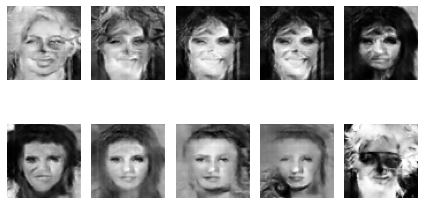

batch 0 processing...


2023-04-18 14:44:56.767831: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 126 loss -> Discriminator : 0.7245772033929825, GAN : 3.0463037490844727
epoch 127/300 processing ...


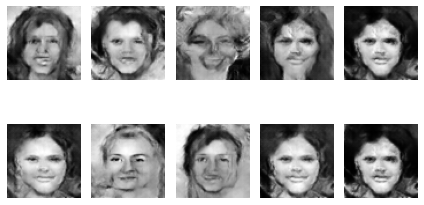

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 127 loss -> Discriminator : 0.8055255115032196, GAN : 3.1453423500061035
epoch 128/300 processing ...


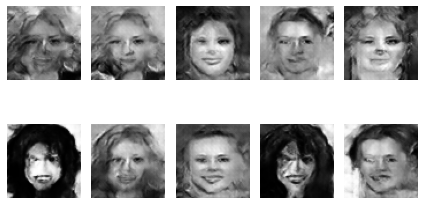

batch 0 processing...


2023-04-18 14:46:40.189537: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 128 loss -> Discriminator : 0.7819714248180389, GAN : 2.8880209922790527
epoch 129/300 processing ...


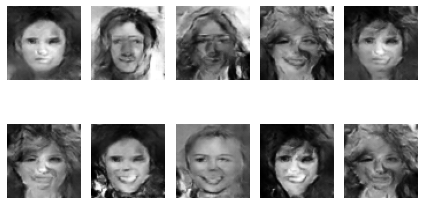

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 129 loss -> Discriminator : 0.869078665971756, GAN : 3.1921727657318115
epoch 130/300 processing ...


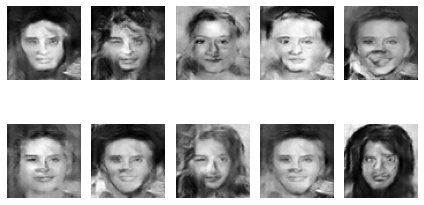

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 14:48:54.028367: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 130 loss -> Discriminator : 0.725700169801712, GAN : 3.0758354663848877
epoch 131/300 processing ...


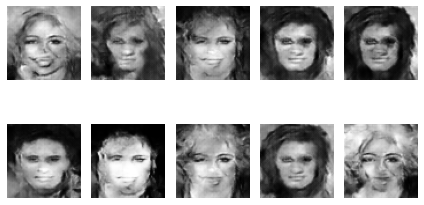

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 131 loss -> Discriminator : 0.9800787568092346, GAN : 2.68304443359375
epoch 132/300 processing ...


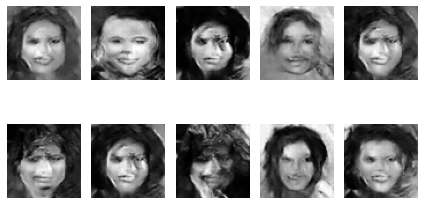

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 132 loss -> Discriminator : 0.8509593904018402, GAN : 3.0969254970550537
epoch 133/300 processing ...


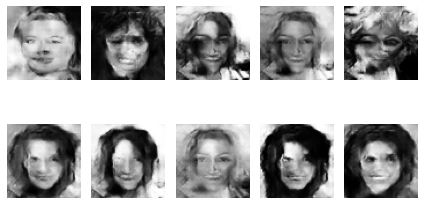

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 133 loss -> Discriminator : 0.43541179597377777, GAN : 2.9216561317443848
epoch 134/300 processing ...


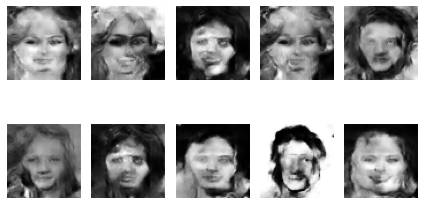

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 134 loss -> Discriminator : 0.6341662108898163, GAN : 3.5319509506225586
epoch 135/300 processing ...


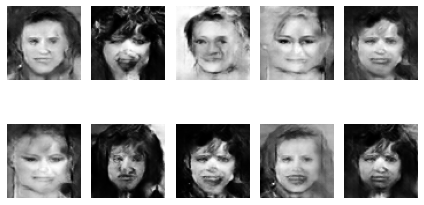

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 135 loss -> Discriminator : 0.7757995426654816, GAN : 2.234639883041382
epoch 136/300 processing ...


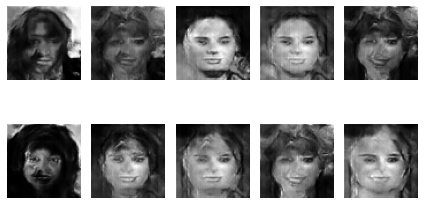

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 14:54:22.139136: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 136 loss -> Discriminator : 0.7627415657043457, GAN : 2.9330878257751465
epoch 137/300 processing ...


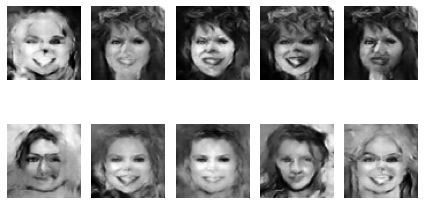

batch 0 processing...


2023-04-18 14:54:29.068574: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 137 loss -> Discriminator : 0.6211947798728943, GAN : 3.669111967086792
epoch 138/300 processing ...


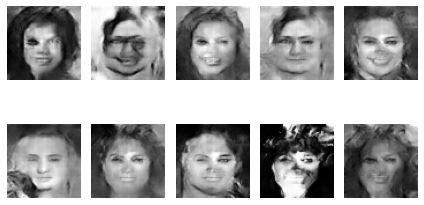

batch 0 processing...


2023-04-18 14:55:24.633177: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 138 loss -> Discriminator : 0.9100905656814575, GAN : 2.516605854034424
epoch 139/300 processing ...


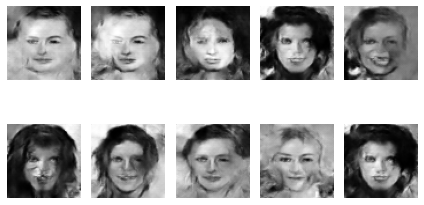

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 139 loss -> Discriminator : 0.7747863531112671, GAN : 2.888110876083374
epoch 140/300 processing ...


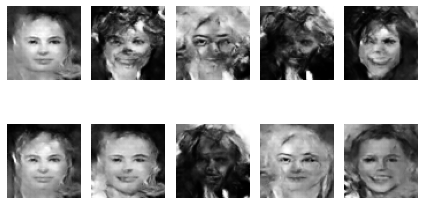

batch 0 processing...


2023-04-18 14:57:04.437277: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...


2023-04-18 14:57:26.901490: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...


2023-04-18 14:57:29.660528: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 140 loss -> Discriminator : 0.5329777747392654, GAN : 3.199855327606201
epoch 141/300 processing ...


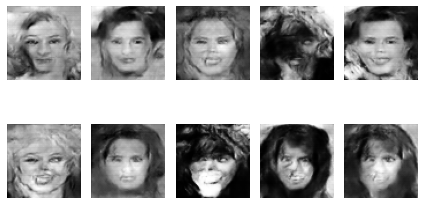

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 141 loss -> Discriminator : 1.1464014649391174, GAN : 2.895139217376709
epoch 142/300 processing ...


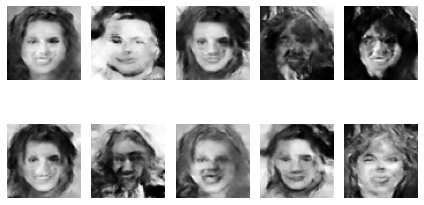

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 142 loss -> Discriminator : 0.7847109735012054, GAN : 2.2527966499328613
epoch 143/300 processing ...


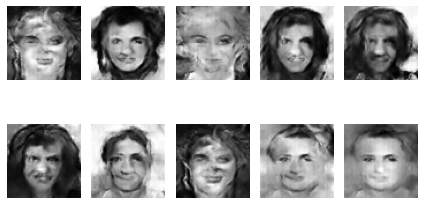

batch 0 processing...
batch 100 processing...


2023-04-18 15:00:04.088196: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 143 loss -> Discriminator : 0.5669011324644089, GAN : 3.4317450523376465
epoch 144/300 processing ...


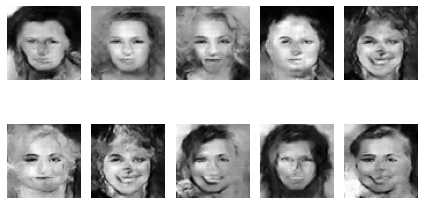

batch 0 processing...
batch 100 processing...


2023-04-18 15:00:54.428557: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 144 loss -> Discriminator : 0.751765787601471, GAN : 2.775343418121338
epoch 145/300 processing ...


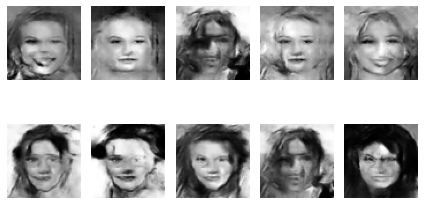

batch 0 processing...


2023-04-18 15:01:29.242877: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 15:01:29.468473: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 145 loss -> Discriminator : 0.7065086364746094, GAN : 3.656639575958252
epoch 146/300 processing ...


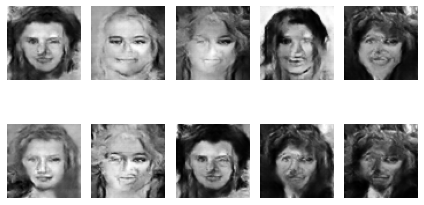

batch 0 processing...


2023-04-18 15:02:28.520025: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 146 loss -> Discriminator : 0.8651167154312134, GAN : 2.597257614135742
epoch 147/300 processing ...


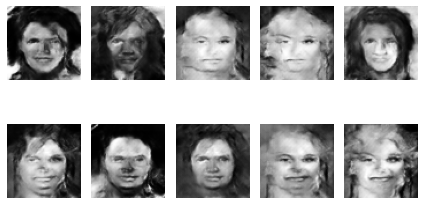

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 147 loss -> Discriminator : 0.6137544810771942, GAN : 3.1964969635009766
epoch 148/300 processing ...


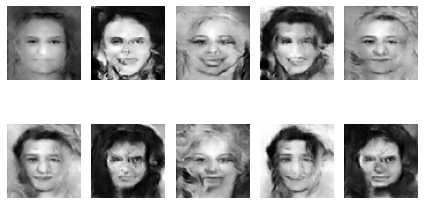

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 15:04:37.777026: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 148 loss -> Discriminator : 1.0153138637542725, GAN : 2.891730785369873
epoch 149/300 processing ...


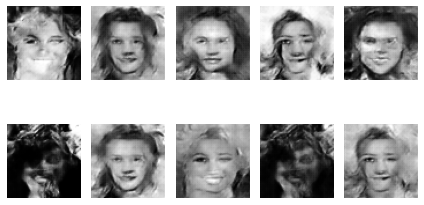

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 149 loss -> Discriminator : 0.5328798592090607, GAN : 2.632669448852539
epoch 150/300 processing ...


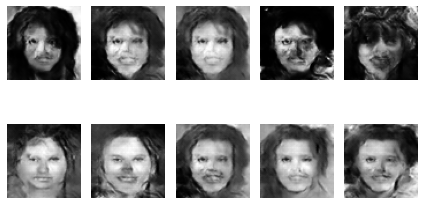

batch 0 processing...
batch 100 processing...


2023-04-18 15:06:00.000876: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 15:06:08.366366: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...


2023-04-18 15:06:38.323776: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 150 loss -> Discriminator : 0.9274415373802185, GAN : 2.0599684715270996
epoch 151/300 processing ...


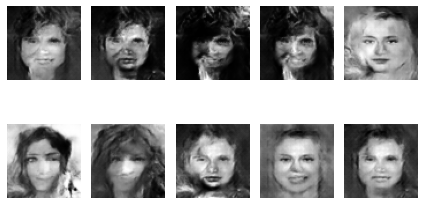

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...


2023-04-18 15:07:27.598678: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 15:07:29.866547: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 15:07:30.178579: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 15:07:30.489732: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


epoch 151 loss -> Discriminator : 0.7888950705528259, GAN : 3.02492094039917
epoch 152/300 processing ...


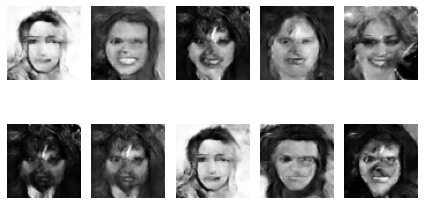

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 152 loss -> Discriminator : 0.6104830801486969, GAN : 3.094024658203125
epoch 153/300 processing ...


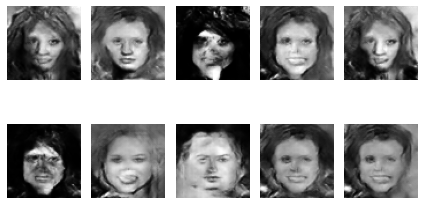

batch 0 processing...


2023-04-18 15:08:29.368991: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled
2023-04-18 15:08:34.361343: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 153 loss -> Discriminator : 0.8793340921401978, GAN : 3.13274884223938
epoch 154/300 processing ...


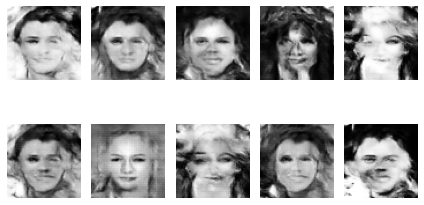

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 154 loss -> Discriminator : 1.0396510362625122, GAN : 2.513615369796753
epoch 155/300 processing ...


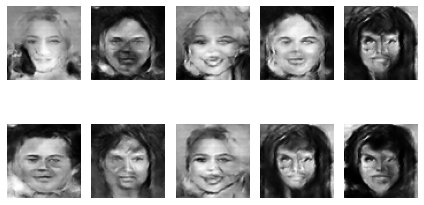

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 155 loss -> Discriminator : 0.718812108039856, GAN : 2.5742568969726562
epoch 156/300 processing ...


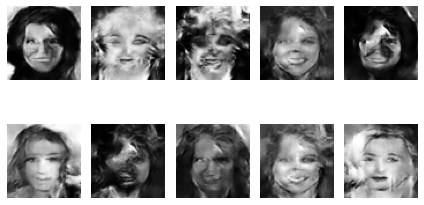

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 156 loss -> Discriminator : 0.778473287820816, GAN : 2.824824810028076
epoch 157/300 processing ...


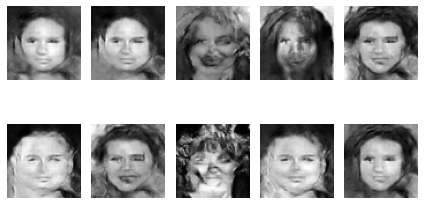

batch 0 processing...
batch 100 processing...
batch 200 processing...
batch 300 processing...
epoch 157 loss -> Discriminator : 1.0148090720176697, GAN : 2.722639799118042
epoch 158/300 processing ...


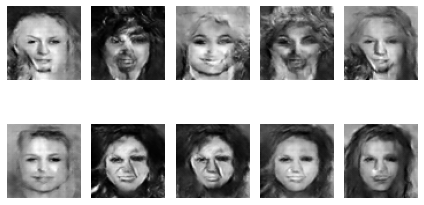

batch 0 processing...
batch 100 processing...


2023-04-18 15:13:06.445058: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...
batch 300 processing...
epoch 158 loss -> Discriminator : 0.6186655610799789, GAN : 3.147810220718384
epoch 159/300 processing ...


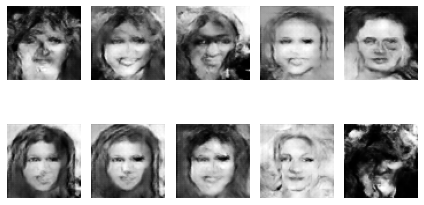

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 15:14:14.413549: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 159 loss -> Discriminator : 1.027400642633438, GAN : 2.960932493209839
epoch 160/300 processing ...


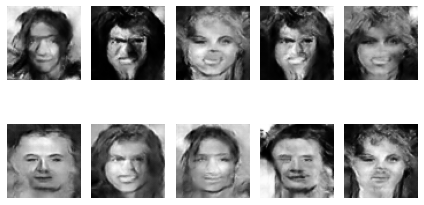

batch 0 processing...
batch 100 processing...
batch 200 processing...


2023-04-18 15:14:56.516186: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 300 processing...
epoch 160 loss -> Discriminator : 0.5287509262561798, GAN : 3.3576881885528564
epoch 161/300 processing ...


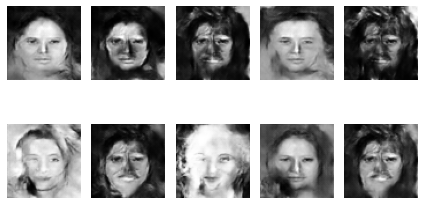

batch 0 processing...


2023-04-18 15:15:31.267604: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 100 processing...


2023-04-18 15:15:48.208719: W tensorflow/core/data/root_dataset.cc:200] Optimization loop failed: CANCELLED: Operation was cancelled


batch 200 processing...


In [ ]:
def predict_pic():
    random = np.random.uniform(-1, 1, size=(10,100)) # 100개 숫자를 10번 -1~1 사이로 뽑아줌
    predict = generator.predict(random)
    for k in range(10):
        plt.subplot(2,5, k+1)
        plt.imshow(predict[k].reshape(64,64), cmap='gray')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


trainX = imgs
for j in range(300):
    print(f'epoch {j}/300 processing ...')
    predict_pic()
    for i in range(50000//128):
        if i%100==0:
            print(f'batch {i} processing...')
        ### discriminator 트레이닝

        # 진짜사진 트레이닝
        realimgs = trainX[i*128 : (i+1)*128]
        ones = np.ones(shape=(128,1)) # 진짜 사진은 1로 마킹되어있어야 하므로 1이 가득찬 리스트 생성
        loss1 = discriminator.train_on_batch(realimgs, ones) # train_on_batch는 loss값을 반환함
        # 가짜사진 트레이닝
        random = np.random.uniform(-1, 1, size=(128,100))
        fakeimgs = generator.predict(random)
        zeros = np.zeros(shape=(128,1))
        loss2 = discriminator.train_on_batch(fakeimgs,zeros)


        ### generator 트레이닝
        np.random.uniform(-1, 1, size=(128,100))
        ones = np.ones(shape=(128,1))
        loss3 = GAN.train_on_batch(random, ones)
    print(f'epoch {j} loss -> Discriminator : {loss1+loss2}, GAN : {loss3}')

discriminator.save('./models/discriminator')
GAN.save('./models/GAN')
generator.save('./models/generator')